In [1]:
import fastdup
fastdup.__version__

'0.906'

In [2]:
work_dir = "./fastdup_report"
images_dir = "./images"

fd = fastdup.create(work_dir, images_dir)
fd.run(cc_threshold=0.88)

/home/dnth/anaconda3/envs/fastdupv1/lib/python3.10/site-packages/fastdup/fastdup_controller.py:290: UserWarning: Fastdup was already applied, use overwrite=True to re-run
  warnings.warn('Fastdup was already applied, use overwrite=True to re-run')


In [3]:
fd.summary()


 ########################################################################################

Dataset Analysis Summary: 

    Dataset contains 35136 images
    Valid images are 99.83% (35,077) of the data, invalid are 0.17% (59) of the data
    For a detailed analysis, use `.invalid_instances()`.

    Similarity:  7.96% (2,796) belong to 46 similarity clusters (components).
    92.04% (32,340) images do not belong to any similarity cluster.
    Largest cluster has 82 (0.23%) images.
    For a detailed analysis, use `.connected_components()`
(similarity threshold used is 0.9, connected component threshold used is 0.88).

    Outliers: 6.16% (2,165) of images are possible outliers, and fall in the bottom 5.00% of similarity values.
    For a detailed list of outliers, use `.outliers()`.


['Dataset contains 35136 images',
 'Valid images are 99.83% (35,077) of the data, invalid are 0.17% (59) of the data',
 'For a detailed analysis, use `.invalid_instances()`.\n',
 'Similarity:  7.96% (2,796) belong to 46 similarity clusters (components).',
 '92.04% (32,340) images do not belong to any similarity cluster.',
 'Largest cluster has 82 (0.23%) images.',
 'For a detailed analysis, use `.connected_components()`\n(similarity threshold used is 0.9, connected component threshold used is 0.88).\n',
 'Outliers: 6.16% (2,165) of images are possible outliers, and fall in the bottom 5.00% of similarity values.',
 'For a detailed list of outliers, use `.outliers()`.']

## 🚫 Invalid Images

In [4]:
invalid_images = fd.invalid_instances()
invalid_images

,img_filename,fastdup_id,error_code,is_valid
0,art and culture/145.jpg,9624,ERROR_ZERO_SIZE_FILE,False
1,art and culture/148 (9).jpg,9682,ERROR_ZERO_SIZE_FILE,False
2,art and culture/155 (3).jpg,9806,ERROR_ZERO_SIZE_FILE,False
3,art and culture/156 (5).jpg,9830,ERROR_ZERO_SIZE_FILE,False
4,art and culture/184 (7).jpg,10363,ERROR_ZERO_SIZE_FILE,False
5,art and culture/188 (5).jpg,10430,ERROR_ZERO_SIZE_FILE,False
6,art and culture/218 (6).jpg,11033,ERROR_ZERO_SIZE_FILE,False
7,art and culture/219 (5).jpg,11051,ERROR_ZERO_SIZE_FILE,False
8,art and culture/266 (2).jpg,11691,ERROR_ZERO_SIZE_FILE,False
9,art and culture/266.jpg,11702,ERROR_ZERO_SIZE_FILE,False


## ♻ Delete Invalid Images

In [5]:
list_of_invalid_images = invalid_images['img_filename'].to_list()
list_of_invalid_images

['art and culture/145.jpg',
 'art and culture/148 (9).jpg',
 'art and culture/155 (3).jpg',
 'art and culture/156 (5).jpg',
 'art and culture/184 (7).jpg',
 'art and culture/188 (5).jpg',
 'art and culture/218 (6).jpg',
 'art and culture/219 (5).jpg',
 'art and culture/266 (2).jpg',
 'art and culture/266.jpg',
 'art and culture/315 (5).jpg',
 'art and culture/316 (5).jpg',
 'art and culture/320 (5).jpg',
 'art and culture/325 (5).jpg',
 'art and culture/325 (6).jpg',
 'art and culture/349 (5).jpg',
 'art and culture/352 (6).jpg',
 'art and culture/358 (4).jpg',
 'art and culture/366 (9).jpg',
 'art and culture/368 (3).jpg',
 'art and culture/370 (2).jpg',
 'art and culture/370 (7).jpg',
 'art and culture/371 (6).jpg',
 'art and culture/395 (6).jpg',
 'art and culture/412 (4).jpg',
 'art and culture/423 (6).jpg',
 'art and culture/431 (4).jpg',
 'art and culture/440 (5).jpg',
 'art and culture/448.jpg',
 'art and culture/451.jpg',
 'art and culture/460 (3).jpg',
 'art and culture/478 (2

In [6]:
from pathlib import Path

def delete_images(file_paths):
    for file_path in file_paths:
        path = images_dir / Path(file_path)
        if path.is_file():
            print(f"Deleting {path}")
            path.unlink()

In [7]:
# delete_images(list_of_invalid_images)

## 🚠 Move Invalid Images to a Folder

In [8]:
import shutil
from pathlib import Path

def move_images_to_folder(file_paths, folder_name="invalid_images"):
    corrupted_images_dir = Path(folder_name)
    corrupted_images_dir.mkdir(exist_ok=True)  # create the directory if it doesn't exist

    for file_path in file_paths:
        path = images_dir / Path(file_path)
        if path.is_file():
            new_path = corrupted_images_dir / Path(file_path)
            new_path.parent.mkdir(parents=True, exist_ok=True)  # create the parent directory if it doesn't exist
            print(f"Moving {path} to {new_path}")
            shutil.move(str(path), str(new_path))


In [9]:
# move_images_to_folder(list_of_invalid_images)

## 👯‍♂️ Duplicate Images

 25%|██▌       | 5/20 [00:00<00:01, 12.26it/s]Traceback (most recent call last):
  File "/home/dnth/anaconda3/envs/fastdupv1/lib/python3.10/site-packages/fastdup/galleries.py", line 365, in do_create_duplicates_gallery
    img, imgpath = create_triplet_img(row, work_dir, save_dir, extract_filenames, get_bounding_box_func,
  File "/home/dnth/anaconda3/envs/fastdupv1/lib/python3.10/site-packages/fastdup/image.py", line 295, in create_triplet_img
    assert img1 is not None, f"Failed to read image1 {img1_path} {str(input_dir)}"
AssertionError: Failed to read image1 images/architecure/32_Contraforts_de_l''església_del_Rosari_al_carrer_de_Mallorca_(l''Alguer).jpg images
100%|██████████| 20/20 [00:00<00:00, 36.93it/s]


Failed to read image from img_path images/architecure/32_Contraforts_de_l''església_del_Rosari_al_carrer_de_Mallorca_(l''Alguer).jpg
Failed to read image from img_path images/architecure/32_Contraforts_de_l''esgl�sia_del_Rosari_al_carrer_de_Mallorca_(l''Alguer).jpg
Failed to generate viz for images 3945 3946 Failed to read image1 images/architecure/32_Contraforts_de_l''església_del_Rosari_al_carrer_de_Mallorca_(l''Alguer).jpg images
Stored similarity visual view in  fastdup_report/galleries/duplicates.html



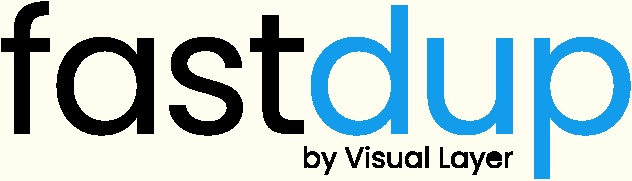
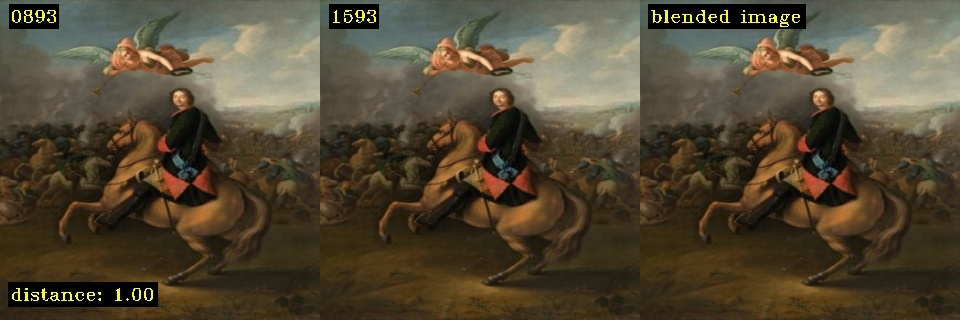
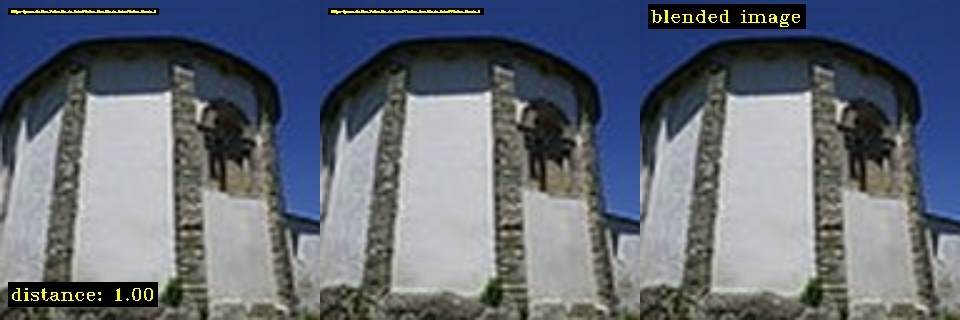
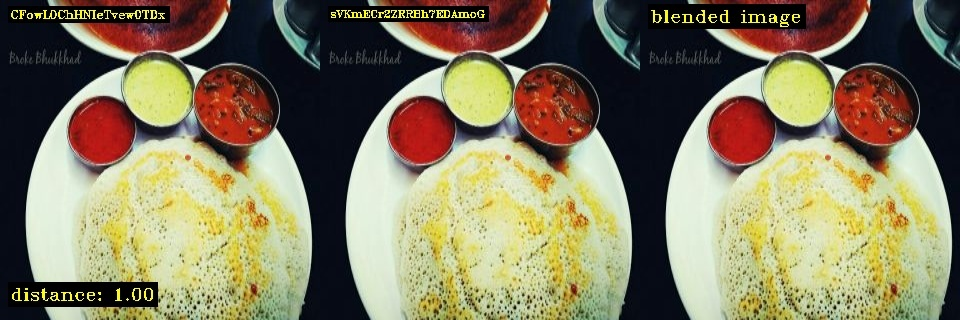
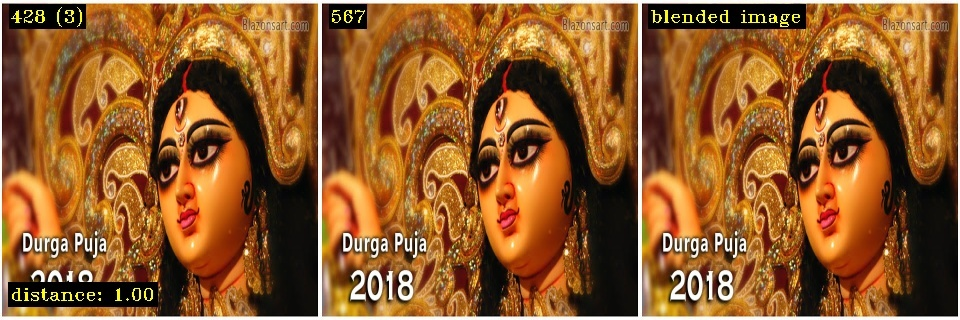
...
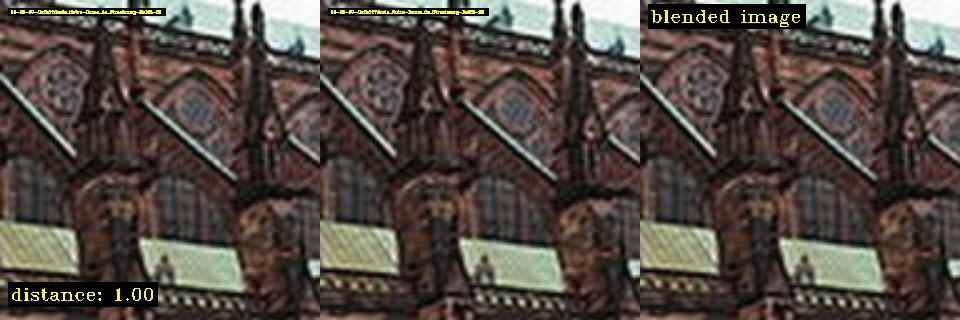
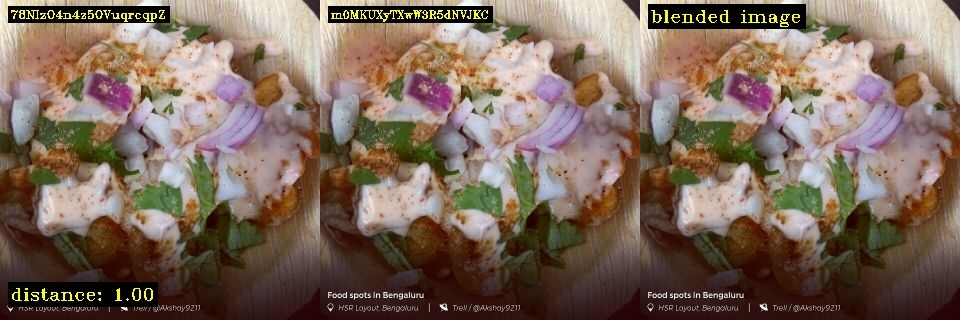
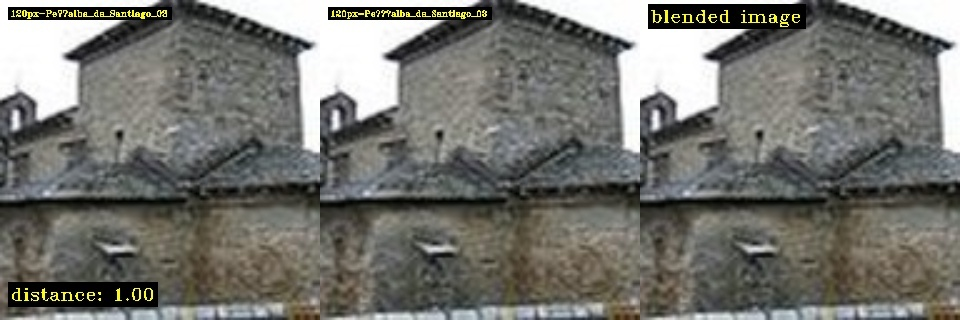
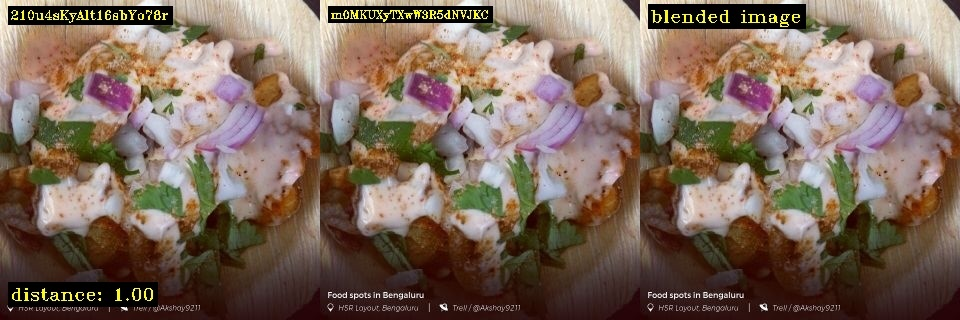
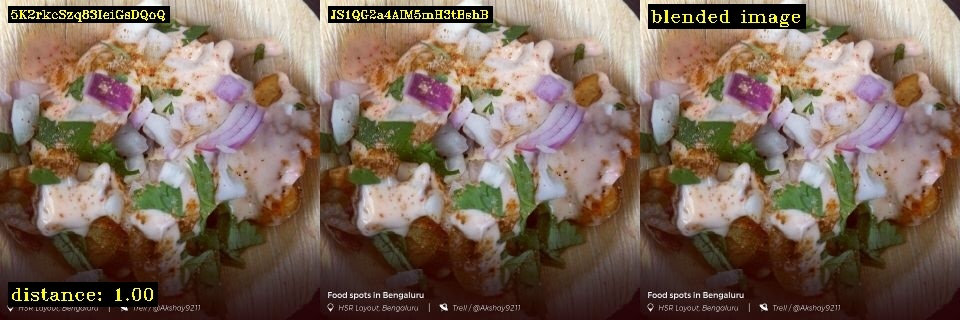

In [10]:
fd.vis.duplicates_gallery()

In [11]:
def get_clusters_of_duplicates(df, sort_by='count', min_count=2, ascending=False):
    agg_dict = {'img_filename': list, 'mean_distance': max, 'count': len}
    df = df[df['count'] >= min_count]
    df = df[df["mean_distance"]==1.0]
    grouped_df = df.groupby('component_id').agg(agg_dict).sort_values(by=[sort_by], ascending=ascending)
    return grouped_df

In [12]:
cc_df, _ = fd.connected_components()
duplicates_df=get_clusters_of_duplicates(cc_df)
duplicates_df

,img_filename,mean_distance,count
component_id,,,
15,"[798343627_7492fe0c12.jpg.jpg, 835415474_7b7f2a9768.jpg.jpg, 978580450_e862715aba.jpg.jpg]",1.0,3
929,"[architecure/14011194459_c5e490e222_m.jpg, architecure/14174688126_16d97c0627_m.jpg, architecure/14217992353_2b5120f5b8_m.jpg]",1.0,3
17774,"[food and d rinks/dsv4KE1dqdr36aG2PC6m.jpg, food and d rinks/DuTuVJQzzfEIMPMK2kRY.jpg, food and d rinks/z3jQCkYBoXtDrw8mxnkH.jpg]",1.0,3
17731,"[food and d rinks/DNUZtNfia0QP1LkRkkKs.png, food and d rinks/OalSKS8ZepeJJZ7rNwZD.png, food and d rinks/PYFXUZZDGzcsoUAEWLhH.png]",1.0,3
17003,"[food and d rinks/AJjFuIwsttpd5l3yGuxW.png, food and d rinks/HnR53JtpgzTskBbgPFKg.png, food and d rinks/kbcgoFeL1BXZzWKSEwfU.png]",1.0,3
...,...,...,...
5994,"[architecure/9279733299_2a4b41a096_n.jpg, architecure/9285426648_8e5a7db342_n.jpg]",1.0,2
6174,"[architecure/Alcobendas_-_Iglesia_de_San_Pedro_Mártir_01.jpg, architecure/Alcobendas_-_Iglesia_de_San_Pedro_M�rtir_01.jpg]",1.0,2
6182,"[architecure/Arboçols._Marcèvol_priory._Apse._12th_C._(21469846248).jpg, architecure/Arbo�ols._Marc�vol_priory._Apse._12th_C._(21469846248).jpg]",1.0,2


In [13]:
def get_list_of_duplicate_images(df):
    df['img_filename'] = df['img_filename'].apply(lambda row: row[1:])
    # Get a list of images to delete from the df
    list_of_duplicate_images=duplicates_df['img_filename'].to_list()
    # Flatten list
    list_of_duplicate_images = [item for sublist in list_of_duplicate_images for item in sublist]
    return list_of_duplicate_images

In [14]:
list_of_duplicate_images = get_list_of_duplicate_images(duplicates_df)
list_of_duplicate_images

['835415474_7b7f2a9768.jpg.jpg',
 '978580450_e862715aba.jpg.jpg',
 'architecure/14174688126_16d97c0627_m.jpg',
 'architecure/14217992353_2b5120f5b8_m.jpg',
 'food and d rinks/DuTuVJQzzfEIMPMK2kRY.jpg',
 'food and d rinks/z3jQCkYBoXtDrw8mxnkH.jpg',
 'food and d rinks/OalSKS8ZepeJJZ7rNwZD.png',
 'food and d rinks/PYFXUZZDGzcsoUAEWLhH.png',
 'food and d rinks/HnR53JtpgzTskBbgPFKg.png',
 'food and d rinks/kbcgoFeL1BXZzWKSEwfU.png',
 'food and d rinks/GDnqpMXh3mia6TK1rigP.jpg',
 'food and d rinks/pIX6YKvYX2sJcgAk5aCo.jpg',
 'food and d rinks/HJtkzNeNg3LtmqLGqp5v.png',
 'food and d rinks/kkABreqygbXm2Ks4XEoC.png',
 'architecure/90px-Oreitia_-_Iglesia_de_San_Julián_y_Santa_Basilisa_03.jpg',
 'architecure/90px-Oreitia_-_Iglesia_de_San_Juli�n_y_Santa_Basilisa_03.jpg',
 'food and d rinks/KX10dti5Q5EjgOTPR3jW.jpg',
 'food and d rinks/VNjdWpUOpDniqRBLwGyA.jpg',
 'food and d rinks/DhE80iQbS01P52DHR2od.png',
 'food and d rinks/PGYqlhHyGjQPa2pQN5db.png',
 'food and d rinks/VaXyM7CkGw71y6eHqIgK.jpeg',

In [15]:
# delete_images(list_of_duplicate_images)

In [16]:
# move_images_to_folder(list_of_duplicate_images, folder_name="duplicate_images")

## 👾 Blurry Images

100%|██████████| 20/20 [00:00<00:00, 490.57it/s]

Stored blur visual view in  fastdup_report/galleries/blur.html



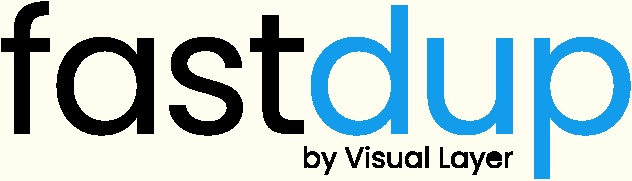
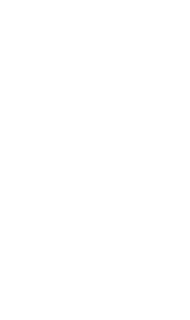
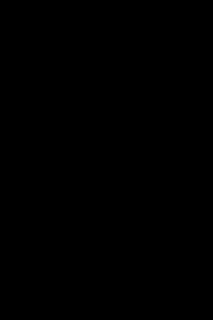
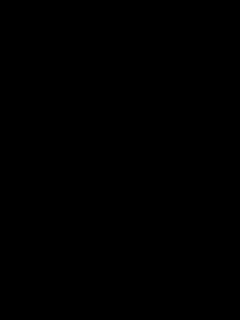
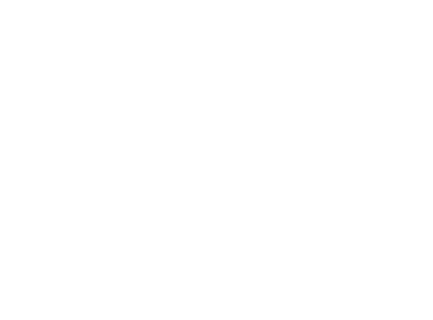
...
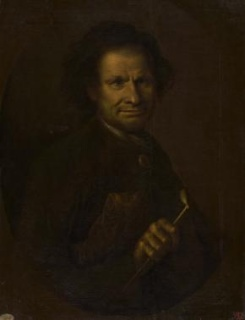
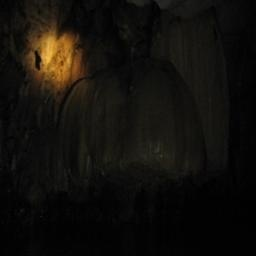
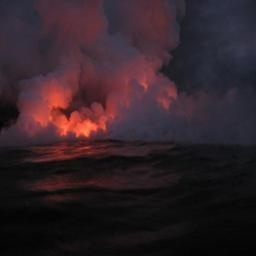
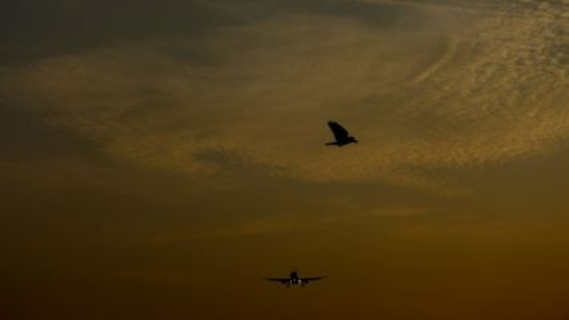
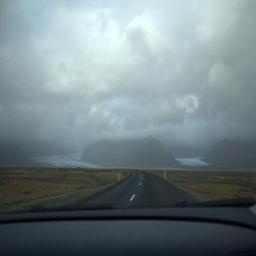

In [17]:
fd.vis.stats_gallery(metric='blur')

## 🌙 Dark Images

100%|██████████| 20/20 [00:00<00:00, 130.02it/s]


Stored mean visual view in  fastdup_report/galleries/mean.html



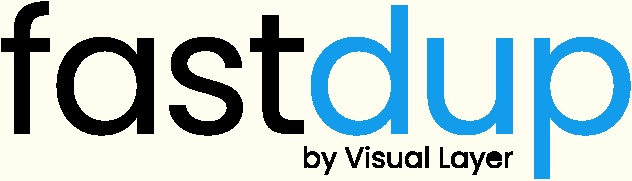
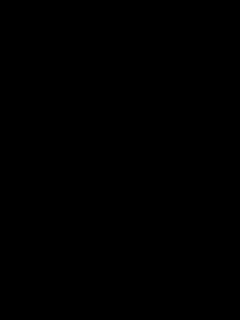
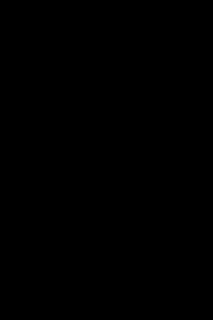
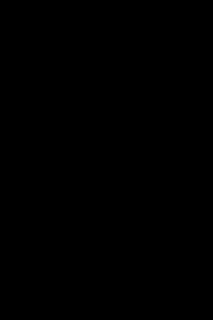
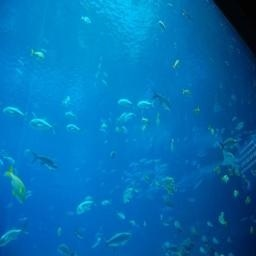
...
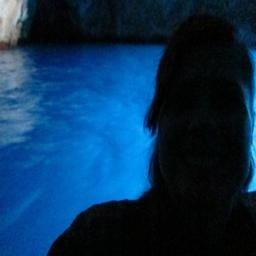
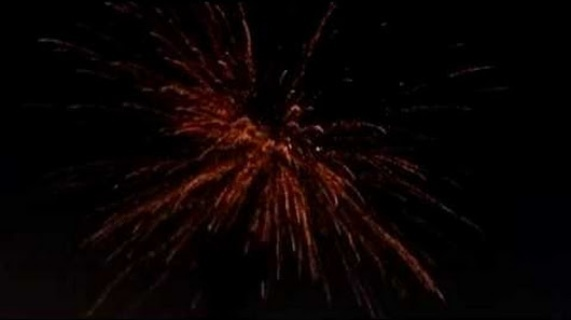
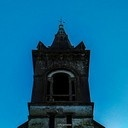
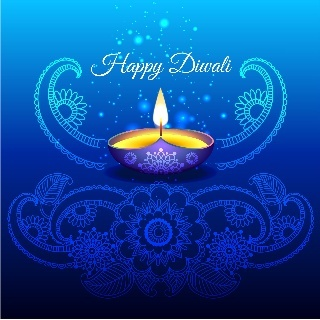
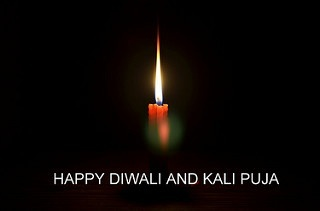

In [18]:
fd.vis.stats_gallery(metric='dark')

## 🌤 Bright Images

100%|██████████| 20/20 [00:00<00:00, 140.30it/s]


Stored mean visual view in  fastdup_report/galleries/mean.html



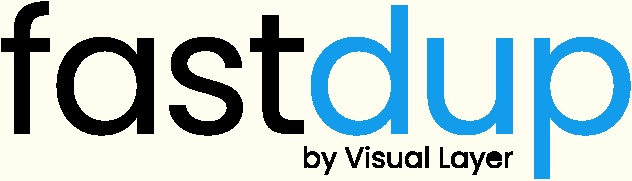
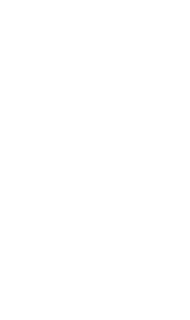
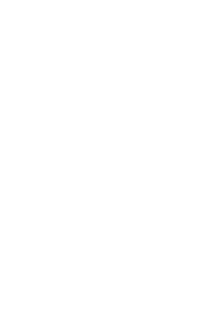
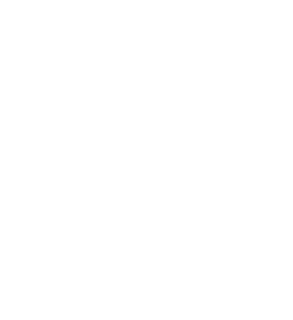
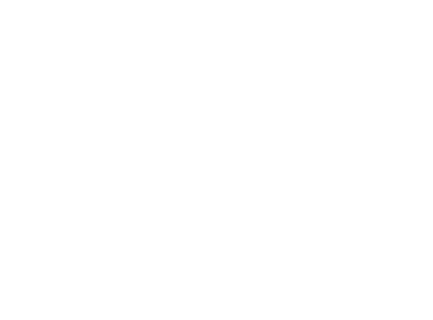
...
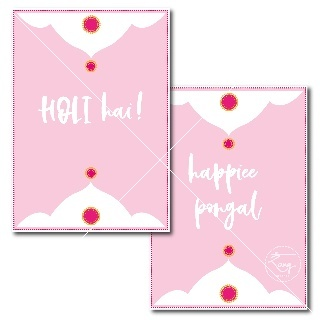
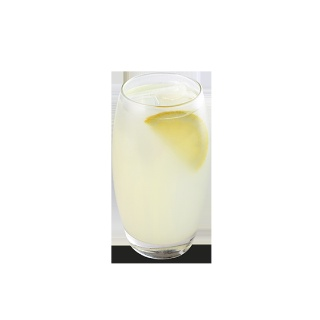
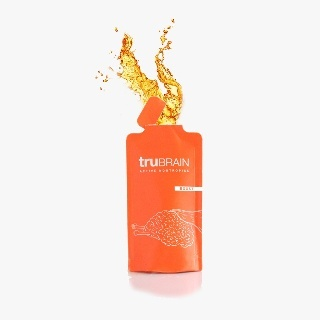
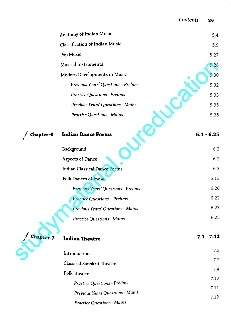
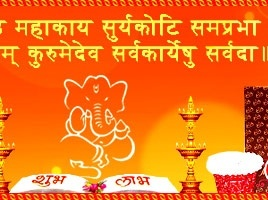

In [19]:
fd.vis.stats_gallery(metric='bright')

## 👾 Image Clusters

100%|██████████| 20/20 [00:00<00:00, 61.30it/s]


Finished OK. Components are stored as image files fastdup_report/galleries/components_[index].jpg
Stored components visual view in  fastdup_report/galleries/components.html
Execution time in seconds 2.4



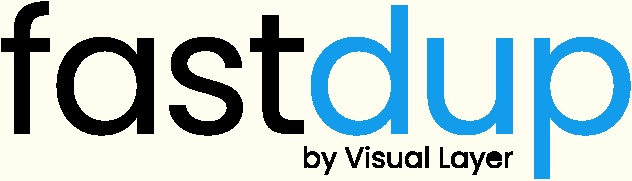
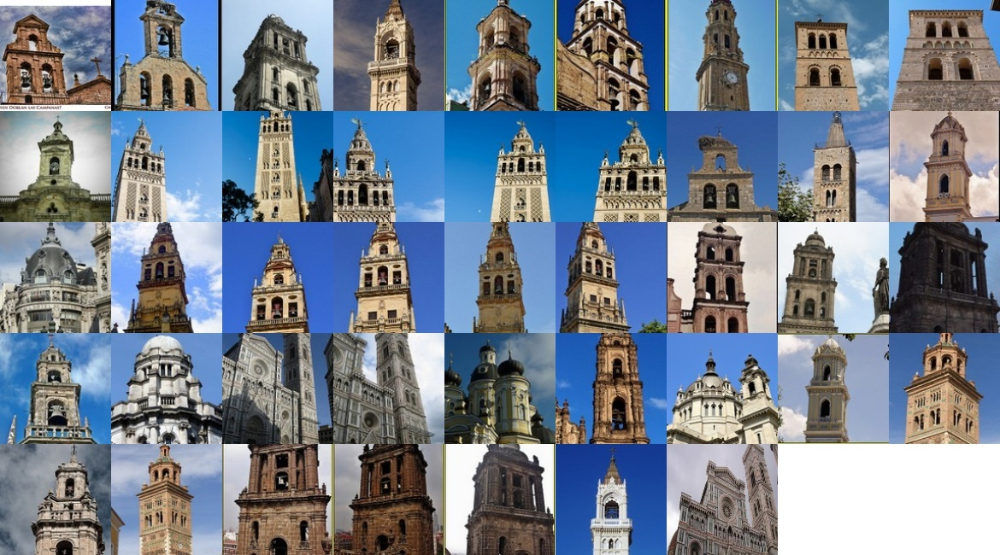
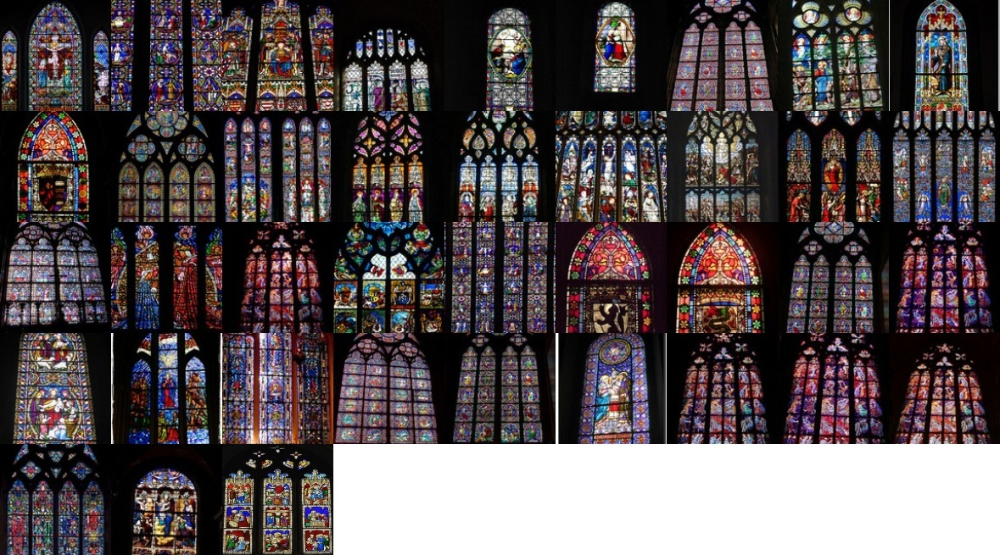
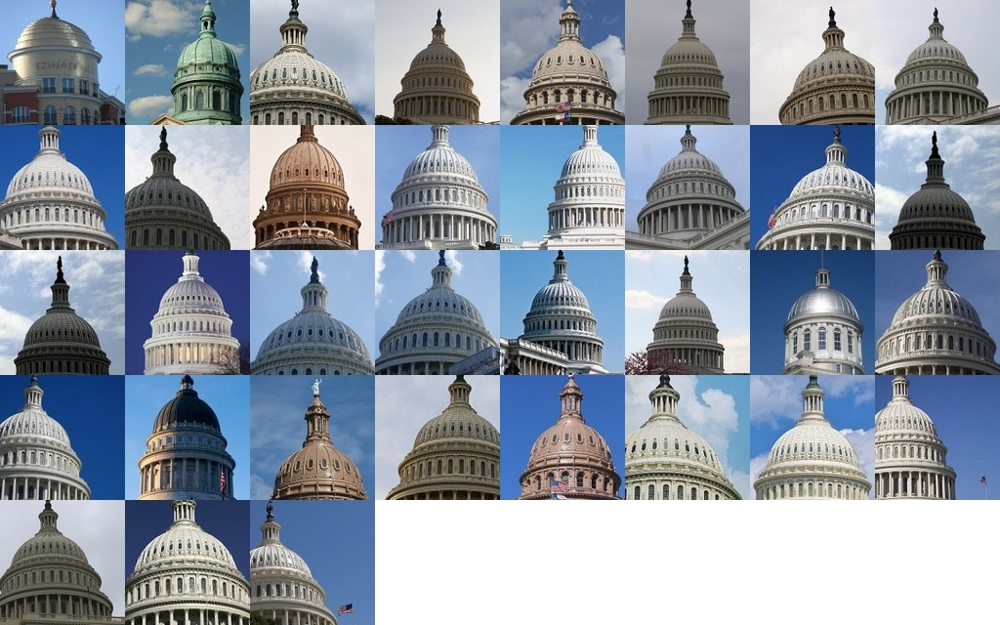
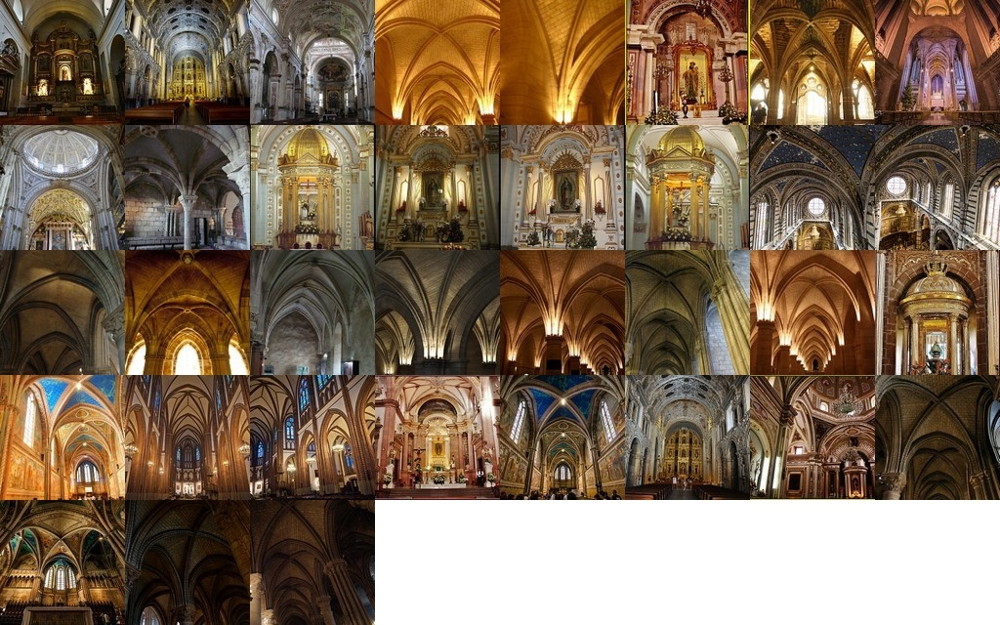
...
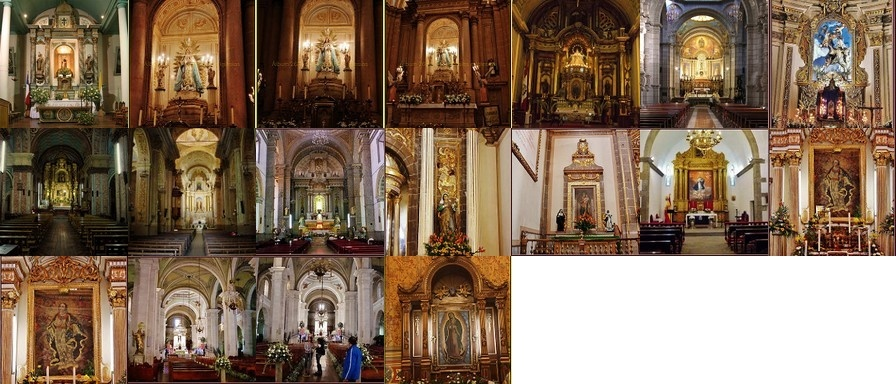
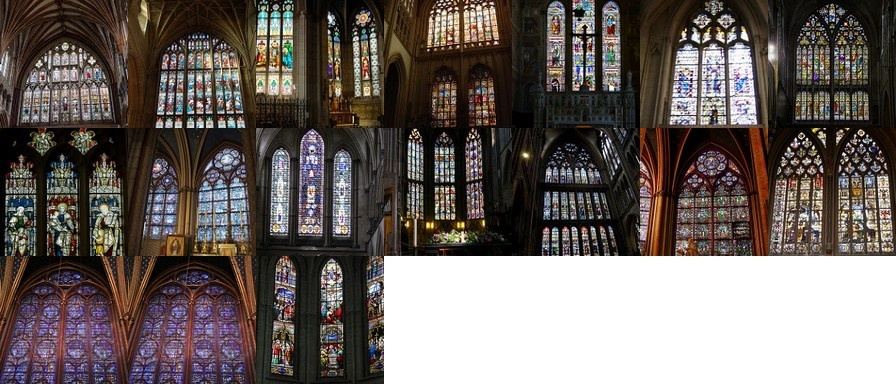
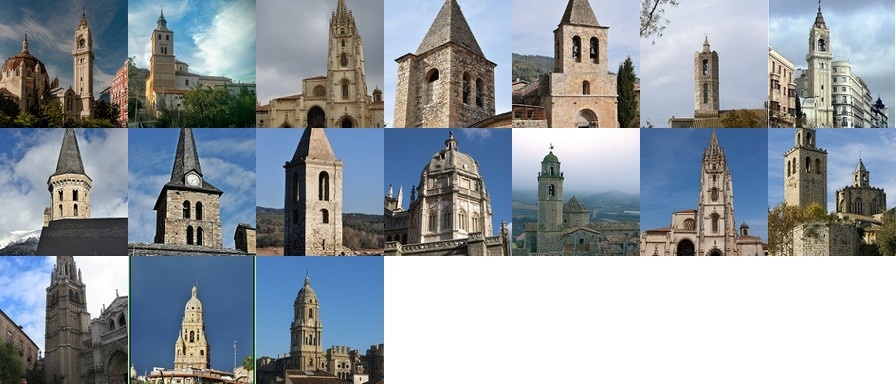
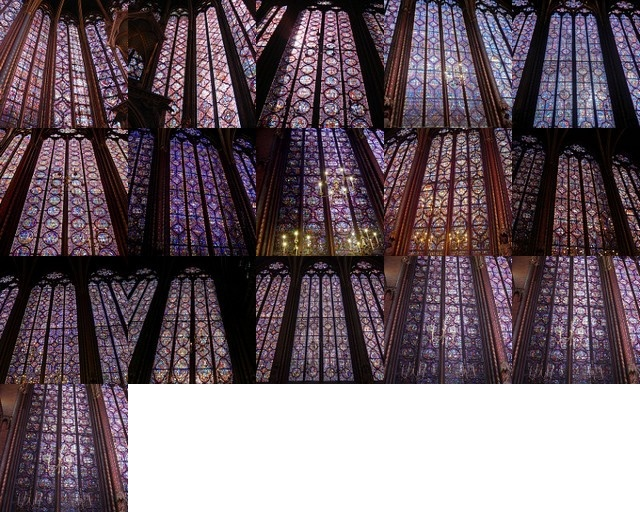
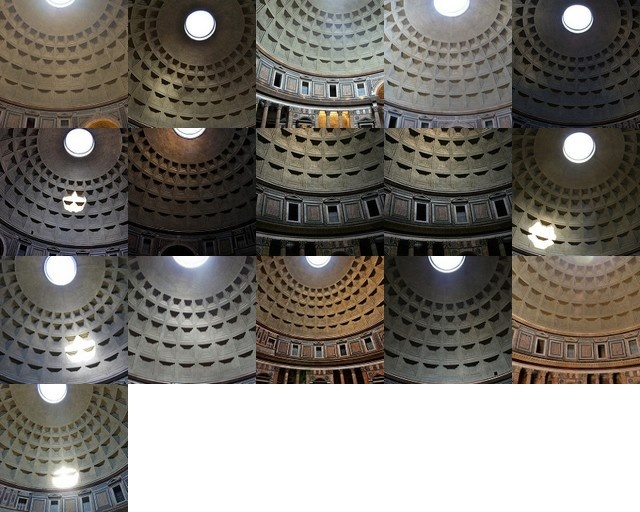

In [20]:
fd.vis.component_gallery()